In [1]:

!pip install torch torchvision numpy pandas matplotlib tqdm clip-by-openai
!pip install git+https://github.com/openai/CLIP.git
!pip install plotly

    

ERROR: Cannot install clip-by-openai==0.1.0, clip-by-openai==0.1.1, clip-by-openai==0.1.1.2, clip-by-openai==0.1.1.3, clip-by-openai==0.1.1.4, clip-by-openai==0.1.1.5, clip-by-openai==1.0.1, clip-by-openai==1.1, torch and torchvision==0.12.0 because these package versions have conflicting dependencies.
ERROR: ResolutionImpossible: for help visit https://pip.pypa.io/en/latest/topics/dependency-resolution/#dealing-with-dependency-conflicts


  Using cached clip_by_openai-1.1-py3-none-any.whl.metadata (369 bytes)
INFO: pip is looking at multiple versions of clip-by-openai to determine which version is compatible with other requirements. This could take a while.
  Using cached clip_by_openai-1.0.1-py3-none-any.whl.metadata (407 bytes)
  Using cached clip_by_openai-0.1.1.5-py3-none-any.whl.metadata (8.6 kB)
  Using cached clip_by_openai-0.1.1.4-py3-none-any.whl.metadata (8.6 kB)
  Using cached clip_by_openai-0.1.1.3-py3-none-any.whl.metadata (8.7 kB)
  Using cached clip_by_openai-0.1.1.2-py3-none-any.whl.metadata (9.0 kB)
  Using cached clip_by_openai-0.1.1-py3-none-any.whl.metadata (9.0 kB)
  Using cached clip_by_openai-0.1.0-py3-none-any.whl.metadata (9.0 kB)
INFO: pip is still looking at multiple versions of clip-by-openai to determine which version is compatible with other requirements. This could take a while.
  Using cached torchvision-0.21.0-cp310-cp310-win_amd64.whl.metadata (6.3 kB)
INFO: This is taking longer than u

  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git 'C:\Users\arthu\AppData\Local\Temp\pip-req-build-y1snrddg'


Part 3 - Clustering using both image and text

In part 1 and part 2, we have practived the art of clustering text and images separately.
However, can we map image and text to the same space? In the Pokemon world, Pokedex
catalogs Pokemon’s appearances and various metadata. We will build our Pokedex from image
dataset link and meta metadata link. Fortunately, ECE 219 Gym kindly provides new Pokemon
trainers with the helper code for data preprocessing and inferencing. Please find the code on
Bruinlearn modules Week 4.

Each Pok´emon may be represented by multiple images and up to two types (for example,
Bulbasaur is categorized as both Grass and Poison types). In this section, we will focus on the
first image (named 0.jpg) in each folder for our analysis.

We will use the pre-trained CLIP [8] to illustrate the idea of multimodal clustering. CLIP
(Contrastive Language–Image Pretraining) is an innovative model developed by OpenAI, designed to understand and connect concepts from both text and images. CLIP is trained on a
vast array of internet-sourced text-image pairs. This extensive training enables the model to
understand a broad spectrum of visual concepts and their textual descriptions.

CLIP consists of two primary components: a text encoder and an image encoder. The text
encoder processes textual data, converting sentences and phrases into numerical representations. Simultaneously, the image encoder transforms visual inputs into a corresponding set
of numerical values. These encoders are trained to map both text and images into a shared
embedding space, allowing the model to compare and relate the two different types of data directly. The training employs a contrastive learning approach, where the model learns to match
corresponding text and image pairs against numerous non-matching pairs. This approach helps
the model in accurately associating images with their relevant textual descriptions and vice
versa.



QUESTION 26: Try to construct various text queries regarding types of Pokemon (such as ”type: Bug”, ”electric type Pokemon” or ”Pok´emon with fire abilities”) to find the relevant images from
the dataset. Once you have found the most suitable template for queries, please find the top five
most relevant Pokemon for type Bug, Fire and Grass. For each of the constructed query, please plot
the five most relevant Pokemon horizontally in one figure with following specifications:

• the title of the figure should be the query you used;
• the title of each Pokemon should be the name of the Pokemon and its first and second type.

Repeat this process for Pokemon of Dark and Dragon types. Assess the effectiveness of your queries
in these cases as well and try to explain any differences.

In [2]:

import torch
import clip
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
from glob import glob
from sklearn.metrics.pairwise import cosine_similarity
from scipy.special import softmax
    

In [3]:
# load csv file and image paths to construct pokedex, use type_to_load=None to load all types, else use a list of types 1 to load
def construct_pokedex(csv_path='Pokemon.csv', image_dir='./images/', type_to_load=None):
    pokedex = pd.read_csv(csv_path)
    image_paths = []

    for pokemon_name in pokedex["Name"]:
        imgs = glob(f"{image_dir}/{pokemon_name}/0.jpg")
        if len(imgs) > 0:
            image_paths.append(imgs[0])
        else:
            image_paths.append(None)

    pokedex["image_path"] = image_paths
    pokedex = pokedex[pokedex["image_path"].notna()].reset_index(drop=True)

    # only keep pokemon with distinct id
    ids, id_counts = np.unique(pokedex["ID"], return_counts=True)
    ids, id_counts = np.array(ids), np.array(id_counts)
    keep_ids = ids[id_counts == 1]

    pokedex = pokedex[pokedex["ID"].isin(keep_ids)].reset_index(drop=True)
    pokedex["Type2"] = pokedex["Type2"].str.strip()
    if type_to_load is not None:
        pokedex = pokedex[pokedex["Type1"].isin(type_to_load)].reset_index(drop=True)
    return pokedex

# load clip model
def load_clip_model():
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model, preprocess = clip.load("ViT-L/14", device=device)
    return model, preprocess, device

# inference clip model on a list of image path
def clip_inference_image(model, preprocess, image_paths, device):
    image_embeddings = []
    with torch.no_grad():
        for img_path in tqdm(image_paths):
            img = Image.open(img_path)
            img_preprocessed = preprocess(img).unsqueeze(0).to(device)
            image_embedding = model.encode_image(img_preprocessed).detach().cpu().numpy()
            image_embeddings += [image_embedding]
            
    image_embeddings = np.concatenate(image_embeddings, axis=0)
    image_embeddings /= np.linalg.norm(image_embeddings, axis=-1, keepdims=True)
    return image_embeddings

# inference clip model on a list of texts
def clip_inference_text(model, preprocess, texts, device):
    with torch.no_grad():
        text_embeddings = model.encode_text(clip.tokenize(texts).to(device)).detach().cpu().numpy()
    text_embeddings /= np.linalg.norm(text_embeddings, axis=-1, keepdims=True)
    return text_embeddings

# compute similarity of texts to each image
def compute_similarity_text_to_image(image_embeddings, text_embeddings):
    similarity = softmax((100.0 * image_embeddings @ text_embeddings.T), axis=-1)
    return similarity

# compute similarity of iamges to each text
def compute_similarity_image_to_text(image_embeddings, text_embeddings):
    similarity = softmax((100.0 * image_embeddings @ text_embeddings.T), axis=0)
    return similarity

def compute_similarity(image_embeddings, text_embeddings):
    similarity = softmax((100.0 * image_embeddings @ text_embeddings.T), axis=-1)
    return similarity

# Use TSNE to project CLIP embeddings to 2D space
def umap_projection(image_embeddings, n_neighbors=15, min_dist=0.1, metric='cosine'):
    distance_matrix = np.zeros((image_embeddings.shape[0], image_embeddings.shape[0]))
    for i in range(image_embeddings.shape[0]):
        for j in range(image_embeddings.shape[0]):
            if i == j:
                distance_matrix[i, j] = 1
            else:
                distance_matrix[i, j] = np.dot(image_embeddings[i], image_embeddings[j])
    distance_matrix = 1 - distance_matrix
    reducer = TSNE(n_components=2, metric="precomputed", init="random", random_state=42)
    visualization_data = reducer.fit_transform(distance_matrix)
    return visualization_data

Answer: We stayed with the basic example query. The effectiveness of the queries depends on the Pokemon type. Some types give highly relevant results while other show inconsistencies. For example, queries for elemental types like Fire and Grass give Pokemon that strongly match the characteristics that we expect, which is most likely because of the distinct visual features associated with them. However, dual-type Pokemon and more ambiguous ones such as Dragon or Dark, the results might give back something that only partially fit the query. This might mean that CLIP relies heavily on visual and textual associations that it learned from the data it trained off of. I believe this could be because of a possible bias in the data set, the way certain Pokemon characters are shown in the images, or the way their name types align with other words in CLIPs representations that it learned. 

In [4]:
# Load data, model
pokedex = construct_pokedex()
clip_model, preprocess, device = load_clip_model()

# embedding
image_embeddings = clip_inference_image(clip_model, preprocess, pokedex['image_path'].tolist(), device)


100%|████████████████████████████████████████████████████████████████████████████████| 754/754 [06:42<00:00,  1.87it/s]


In [5]:
type_queries = ['type: Bug', 'type: Fire', 'type: Grass', 'type: Dark', 'type: Dragon']
text_embeddings = clip_inference_text(clip_model, preprocess, type_queries, device)


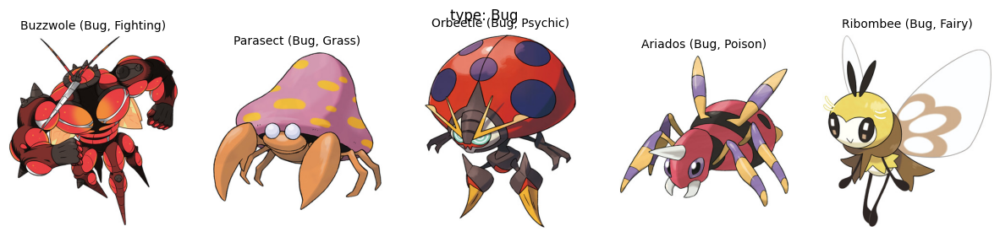

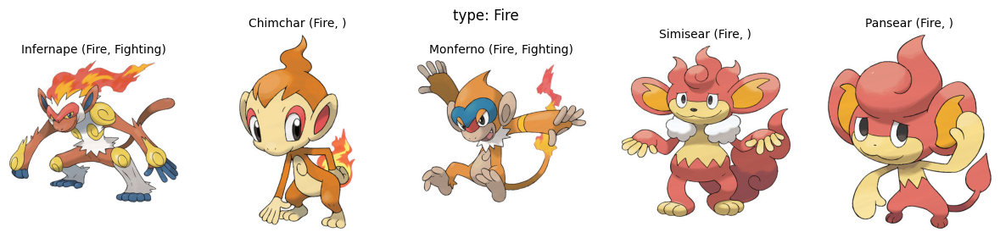

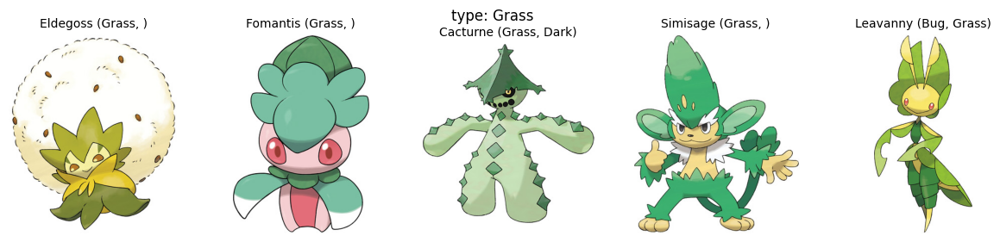

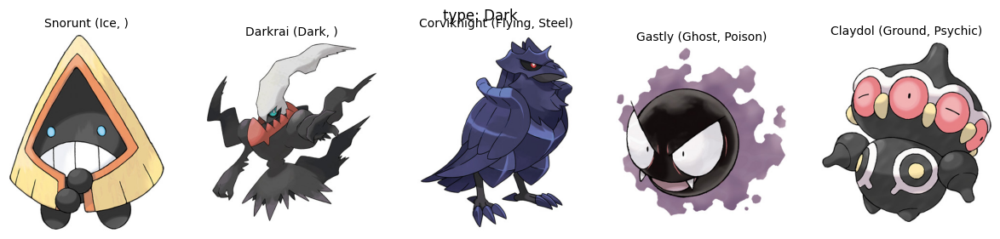

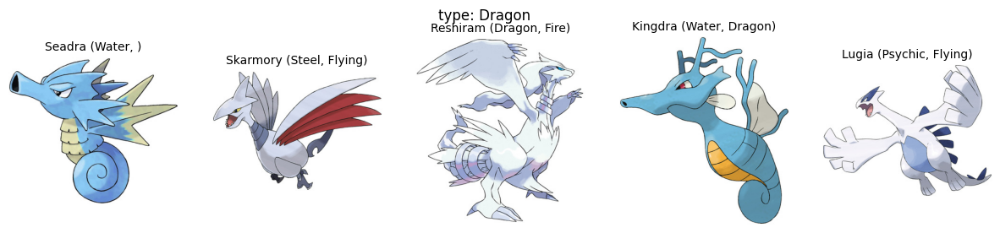

In [6]:
similarity_scores = compute_similarity(image_embeddings, text_embeddings)
top5_indices = np.argsort(-similarity_scores, axis=0)[:5]  # we use - for descending order

for query_index, query in enumerate(type_queries):
    fig, axes = plt.subplots(1, 5, figsize=(15, 3))
    fig.suptitle(query)

    for rank, ax in enumerate(axes):
        img_index = top5_indices[rank, query_index]
        image = Image.open(pokedex.loc[img_index, 'image_path'])
        
        ax.imshow(image)
        ax.axis('off')

        name = pokedex.loc[img_index, 'Name']
        type1 = pokedex.loc[img_index, 'Type1']
        type2 = pokedex.loc[img_index, 'Type2']
        
        title = f"{name} ({type1}" + (f", {type2})" if pd.notna(type2) else ")")
        ax.set_title(title, fontsize=10)

    plt.show()


QUESTION 27

In [7]:
# list of pokemon types
pokemon_types = ['Bug', 'Electric', 'Fire', 'Grass', 'Water', 'Dark', 'Dragon', 'Fairy', 'Ice', 'Psychic', 'Rock', 'Ground', 'Steel', 'Flying', 'Fighting', 'Normal', 'Poison', 'Ghost']
type_queries = [f"type: {ptype}" for ptype in pokemon_types]
text_embeddings = clip_inference_text(clip_model, preprocess, type_queries, device)

In [8]:
# randomly select 10 Pokemon
selected_indices = np.random.choice(len(pokedex), 10, replace=False)
selected_pokemon = pokedex.iloc[selected_indices]
selected_image_embeddings = clip_inference_image(clip_model, preprocess, selected_pokemon['image_path'].tolist(), device)
similarity = compute_similarity(selected_image_embeddings, text_embeddings)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:05<00:00,  1.84it/s]


Answer: 

The tables below allow us to evaluate the model's ability to associate visual features with Pokemon typings. 

From the tables below, we can observe that CLIP is often able to correctly identify a Pokemon's primary type, especially for well known or visually unique Pokemon. 

Here are some notable patterns in the predictions:

1. Some Pokemon as corectly cassified with high confidence in their primary type, which shows that CLIP does recognize clear visual cues. 
2. Sometimes when a Pokemon has a secondary type, the model sometimes doesn't recognize it or assigns it a less relevant type with higher confidence. 
3. Some Pokemon receive predicted types that are not part of their actual aclssification, however they share visual or a thematic similarity. An example of this is a Pokemon with a dark color palette that might be classified as a dark type. 
4. Some types such as Normal, Psychic, and Fighting seem to be more common in the predictions, which would be because of a learning biases from its training data. 

Overall, it seems that CLIP can effectively capture primary visual features, but it might struggle with more unique type distinctions, specifically those with secondary types or less common attributes. 

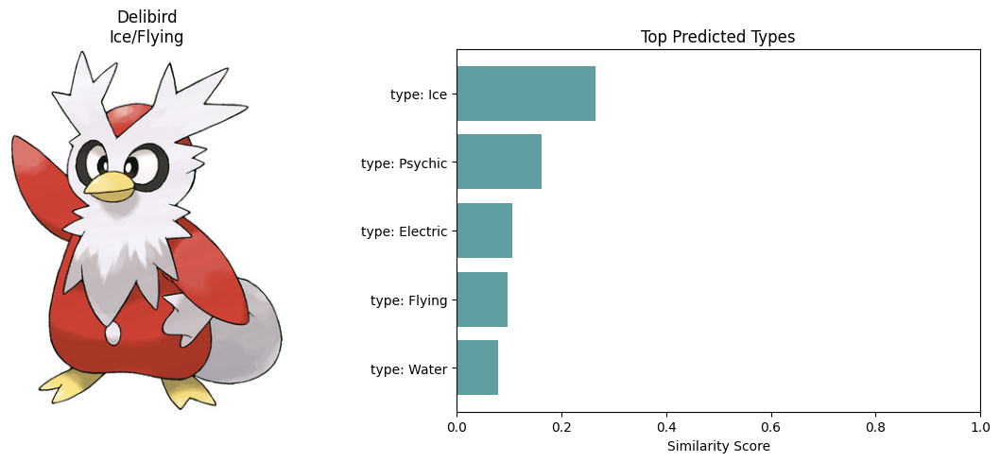

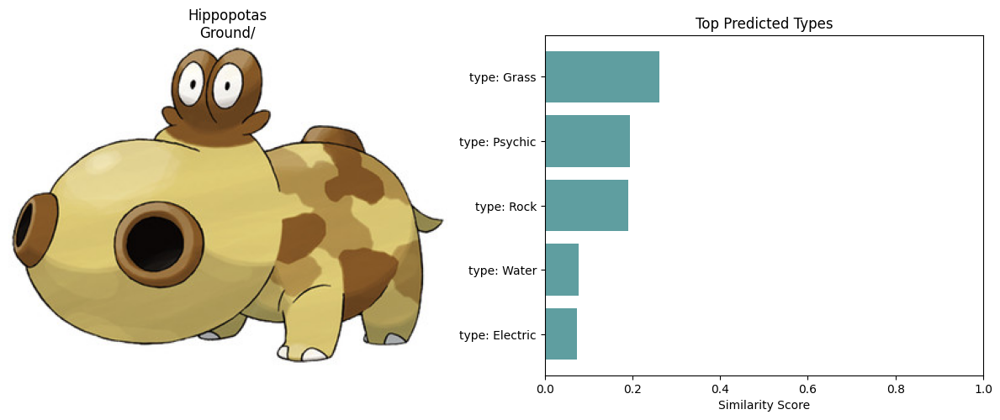

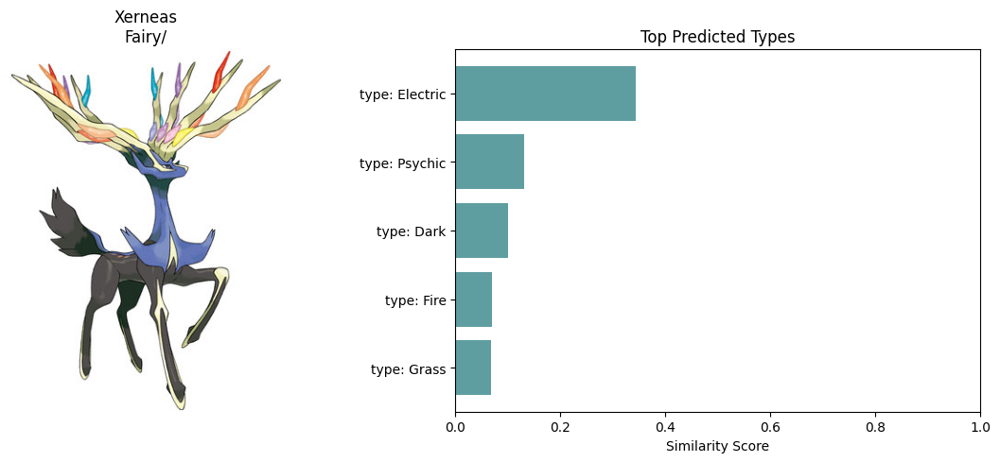

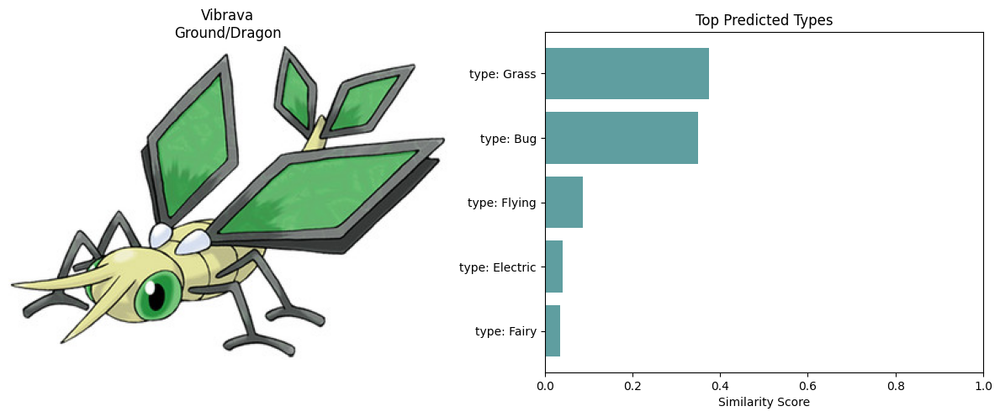

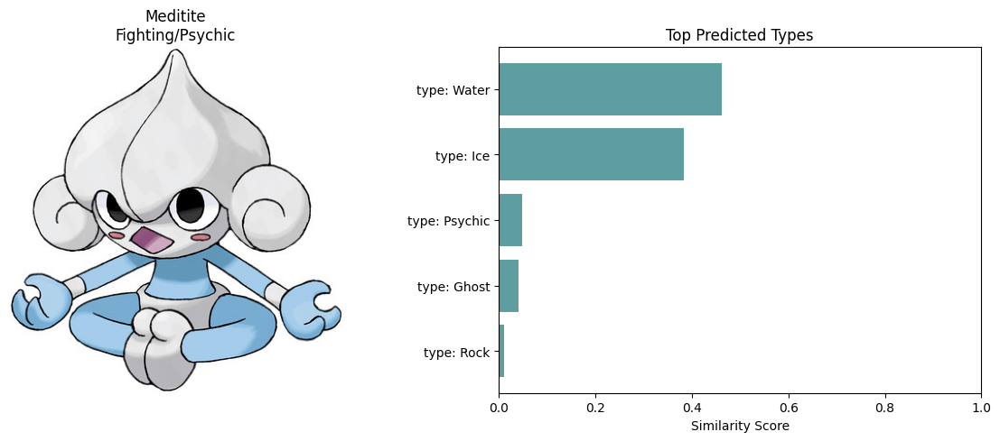

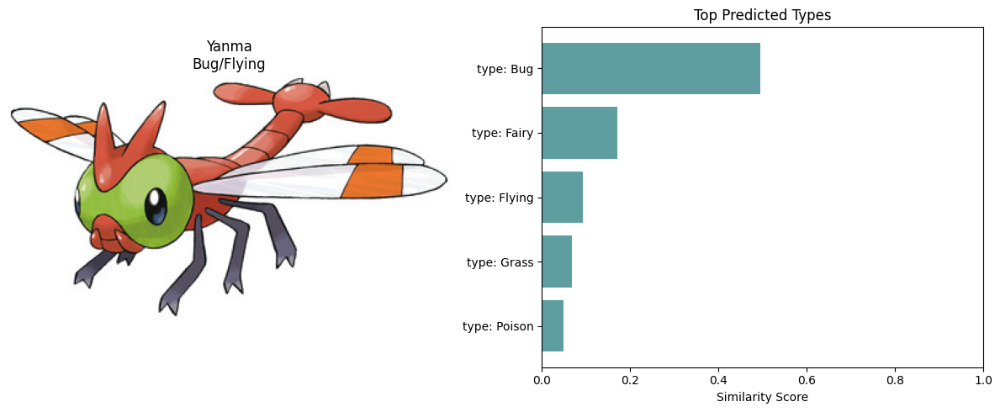

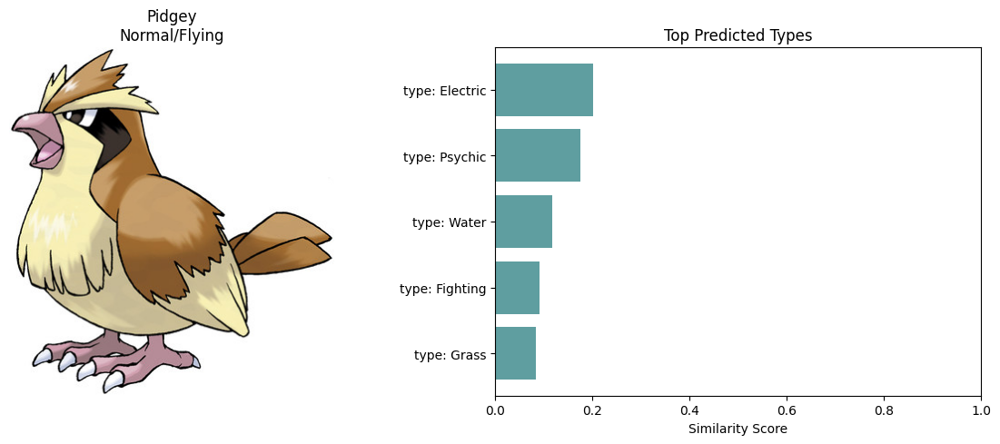

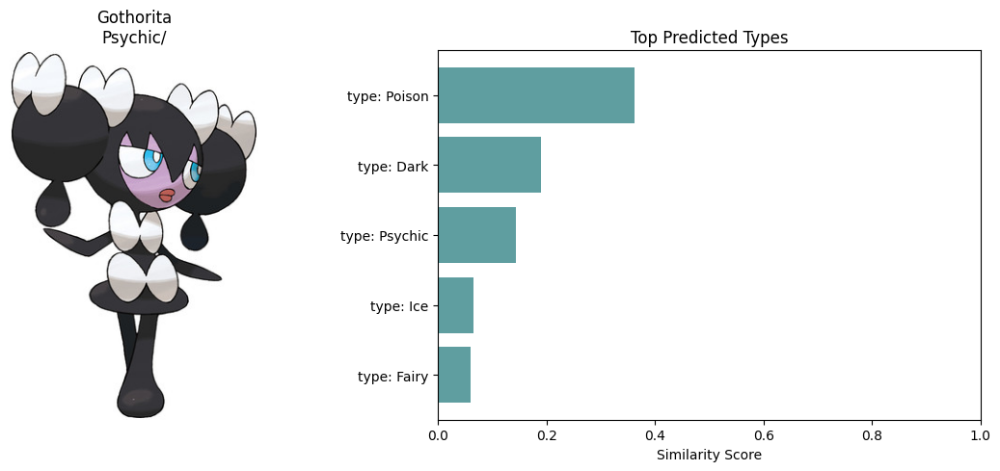

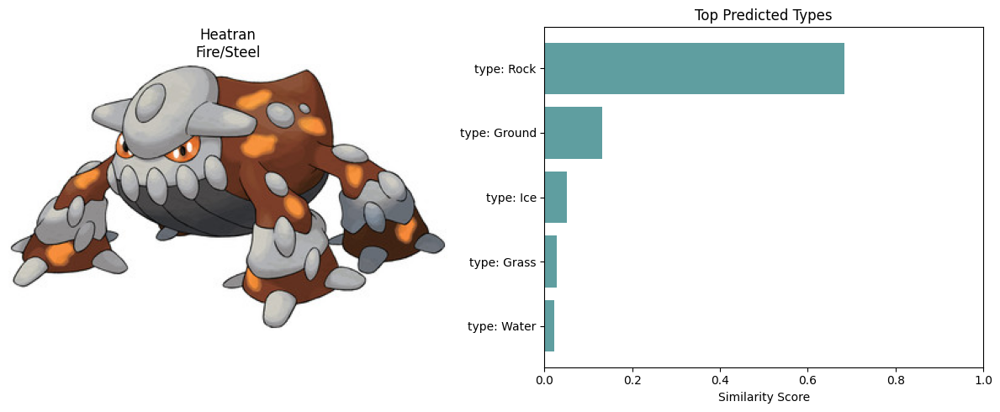

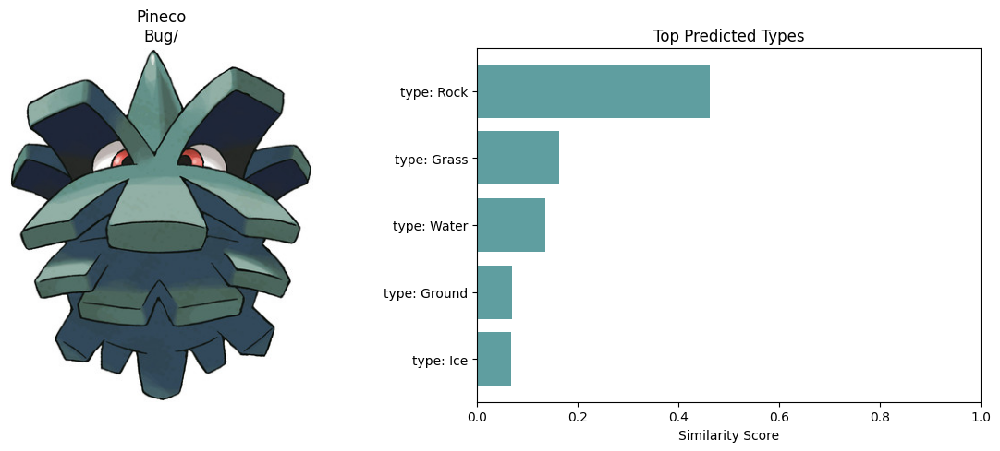

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

for i, idx in enumerate(selected_indices):
    # Prepare figure with two subplots (one for the image, one for the bar chart)
    fig, (ax_img, ax_bar) = plt.subplots(1, 2, figsize=(12, 5)) # make two subplots
    
    
    img_path = pokedex.iloc[idx]['image_path'] # left subplot pokemon image
    img = Image.open(img_path)
    ax_img.imshow(img)
    ax_img.axis('off')
    
    # set titles
    name = pokedex.iloc[idx]['Name'] 
    type1 = pokedex.iloc[idx]['Type1']
    type2 = pokedex.iloc[idx]['Type2']
    ax_img.set_title(f"{name}\n{type1}/{type2}", fontsize=12)
    
    # get top 5 and sort in decsending order
    top_types_indices = np.argsort(similarity[i])[::-1][:5]
    top_types_scores = np.sort(similarity[i])[::-1][:5]
    
    # get actual type labels
    top_types_labels = [type_queries[idx_] for idx_ in top_types_indices]
    
    # plot as horizontal chart
    ax_bar.barh(top_types_labels, top_types_scores, color='cadetblue')
    ax_bar.invert_yaxis()  # So the highest score is on top
    ax_bar.set_xlim(0, 1)
    ax_bar.set_xlabel('Similarity Score')
    ax_bar.set_title('Top Predicted Types', fontsize=12)
    
    
    plt.tight_layout()
    plt.show()


QUESTION 28: In the first and second question, we investigated how CLIP creates ’clusters’ by mapping images and texts of various Pokemon into a high-dimensional space and explored neighbor- hood of these items in this space. For this question, please use t-SNE to visualize image clusters, specifically for Pokemon types Bug, Fire, and Grass. You can use scatter plot from python package plotly. For the visualization, color-code each point based on its first type type 1 using the ’color’ argument, and label each point with the Pokemon’s name and types using ’hover name’. This will enable you to identify each Pokemon represented in your visualization. After completing the visualization, analyze it and discuss whether the clustering of Pokemon types make sense to you.

ANSWER: Looking at the scatter plot, I noticed that there are some noticable overlap between some types. Fire type okemon seem more distinct compared to the early tones of the Bug and GRass pokemon. This means that even though CLIP embeddings capture visual similarities, they don't perfectly align with the pokemon type classifications, which as based on in game mechanics. Also, since t-SNE is non linear, it means that some information is lost during the dimension reduction process, which could cause even more overlapping in the clusters. 

In [10]:
import os
import numpy as np
import pandas as pd
import torch
import clip
from PIL import Image
from sklearn.manifold import TSNE
import plotly.express as px


device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# extract clip features from an image
def extract_clip_features(image_path):
    image = Image.open(image_path).convert("RGB")
    image = preprocess(image).unsqueeze(0).to(device)
    with torch.no_grad():
        features = model.encode_image(image)
    return features.cpu().numpy().flatten()
csv_path = "Pokemon.csv"
image_folder_path = "./images"

df_pokemon = pd.read_csv(csv_path)

selected_types = ["Bug", "Fire", "Grass"]
df_selected = df_pokemon[df_pokemon["Type1"].isin(selected_types)]

# get eeach pokemons features
pokemon_features = []
pokemon_labels = []

for _, row in df_selected.iterrows():
    pokemon_name = row["Name"]
    type1 = row["Type1"]
    
    pokemon_folder = os.path.join(image_folder_path, pokemon_name)
    image_path = os.path.join(pokemon_folder, "0.jpg")  

    if os.path.exists(image_path):
        features = extract_clip_features(image_path)
        pokemon_features.append(features)
        pokemon_labels.append((pokemon_name, type1))

# convert to NumPy array 
pokemon_features = np.array(pokemon_features)
pokemon_labels_df = pd.DataFrame(pokemon_labels, columns=["Name", "Type1"])


tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(pokemon_features)


df_plot = pd.DataFrame(tsne_results, columns=["TSNE1", "TSNE2"])
df_plot["Type"] = pokemon_labels_df["Type1"].values
df_plot["Pokemon"] = pokemon_labels_df["Name"].values

# use plotly to create scatter plot
fig = px.scatter(
    df_plot,
    x="TSNE1",
    y="TSNE2",
    color="Type",
    hover_name="Pokemon",
    title="t-SNE Visualization of Pokémon Types (Bug, Fire, Grass)",
    labels={"TSNE1": "t-SNE Component 1", "TSNE2": "t-SNE Component 2"},
)

fig.show()
